<a href="https://colab.research.google.com/github/boroju/aidl-upc-winter2024-satellite-imagery/blob/main/notebooks/jose/dataset_eda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pip install leafmap -q
%pip install localtileserver -q
%pip install rioxarray -q

In [2]:
import os
import leafmap.leafmap as leafmap
import glob
import random
import numpy as np
from ipyleaflet import Map, Marker, LayersControl

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Paths to files here:
land_covers = glob.glob('/content/drive/My Drive/upc_project_dataset/binary_classification/fire/landcover_*.tif')
fire_masks = glob.glob('/content/drive/My Drive/upc_project_dataset/binary_classification/fire_mask/fire_mask*.tif')

In [4]:
# Choose a random number of masks and images

NUM_IMAGES = 5

random_land_covers = random.sample(land_covers, NUM_IMAGES)
indices = np.where(np.isin(land_covers,random_land_covers))[0].tolist()
random_masks = [fire_masks[i] for i in indices]

assert len(random_land_covers) == len(random_masks)

In [5]:
random_land_covers

['/content/drive/My Drive/upc_project_dataset/binary_classification/fire/landcover_027.tif',
 '/content/drive/My Drive/upc_project_dataset/binary_classification/fire/landcover_095.tif',
 '/content/drive/My Drive/upc_project_dataset/binary_classification/fire/landcover_040.tif',
 '/content/drive/My Drive/upc_project_dataset/binary_classification/fire/landcover_058.tif',
 '/content/drive/My Drive/upc_project_dataset/binary_classification/fire/landcover_064.tif']

In [6]:
# Plot the images
m = leafmap.Map()

control = LayersControl(position='topright')
m.add(control)

for land_cover in random_land_covers:
  m.add_raster(land_cover, bands=[1, 2, 3], layer_name=os.path.basename(land_cover))

for fire_mask in random_masks:
  m.add_raster(fire_mask, colormap='terrain', layer_name=os.path.basename(fire_mask))

m

INFO:large_image:Cannot use memcached for caching.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…


Some example code to manually plot images and masks on a map:
```
m = leafmap.Map()
m.add_raster('/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire/landcover_020.tif', colormap='terrain', layer_name='No Fire')
m.add_raster('/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire_mask/no_fire_mask_020.tif', colormap='terrain', layer_name='No Fire')
m
```



Source:


https://code.earthengine.google.com/2a58a24d2bbbd1e43d30bc795e824246

# Debug

Some code to debug the content of the raster files.

Reason: Masks with all 0 values return an error when trying to plot in a `leafmap.Map()` altough the dataset is valid.

In [7]:
import rioxarray as xr
tra_scene_sample = xr.open_rasterio("/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire/landcover_005.tif")
print(tra_scene_sample.shape)
print(tra_scene_sample.coords)
tra_scene_sample

(3, 1417, 1848)
Coordinates:
  * band         (band) int64 1 2 3
  * x            (x) float64 -121.7 -121.7 -121.7 ... -121.6 -121.6 -121.6
  * y            (y) float64 39.94 39.94 39.94 39.94 ... 39.88 39.88 39.88 39.88
    spatial_ref  int64 0


<xarray.DataArray (band: 3, y: 1417, x: 1848)>
[7855848 values with dtype=uint8]
Coordinates:
  * band         (band) int64 1 2 3
  * x            (x) float64 -121.7 -121.7 -121.7 ... -121.6 -121.6 -121.6
  * y            (y) float64 39.94 39.94 39.94 39.94 ... 39.88 39.88 39.88 39.88
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    name:           R
    _FillValue:     0
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      ('R', 'G', 'B')

EPSG:4326
BoundingBox(left=-121.70779711129131, bottom=39.87792226110539, right=-121.62479277903867, top=39.941567898985255)
| 0.00, 0.00,-121.71|
| 0.00,-0.00, 39.94|
| 0.00, 0.00, 1.00|
(1, 2, 3)


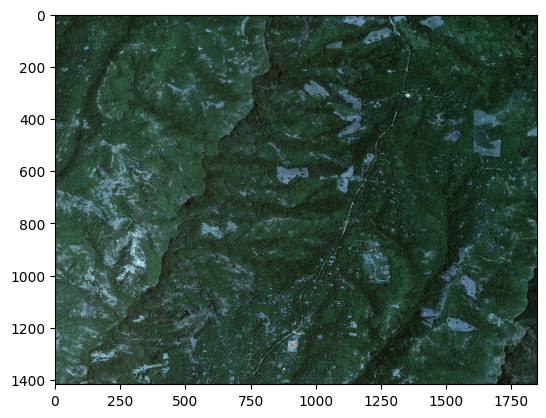

<Axes: >

In [8]:
import rasterio
_dataset = rasterio.open('/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire/landcover_005.tif')
_dataset
print(_dataset.crs)
print(_dataset.bounds)
print(_dataset.transform)
print(_dataset.indexes)

import numpy as np
from rasterio.plot import show, adjust_band
imgdata = np.array([adjust_band(_dataset.read(i)) for i in (3,2,1)])
show(imgdata)  # factor 3 to increase brightness

In [9]:
import rioxarray as xr
correct_sample = xr.open_rasterio("/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire_mask/no_fire_mask_001.tif")
print(correct_sample.shape)
print(correct_sample.coords)
correct_sample

(1, 1417, 1841)
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -121.8 -121.8 -121.8 ... -121.8 -121.8 -121.8
  * y            (y) float64 39.69 39.69 39.69 39.69 ... 39.62 39.62 39.62 39.62
    spatial_ref  int64 0


<xarray.DataArray (band: 1, y: 1417, x: 1841)>
[2608697 values with dtype=uint8]
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -121.8 -121.8 -121.8 ... -121.8 -121.8 -121.8
  * y            (y) float64 39.69 39.69 39.69 39.69 ... 39.62 39.62 39.62 39.62
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:             Area
    name:                      mask
    STATISTICS_APPROXIMATE:    YES
    STATISTICS_MAXIMUM:        1
    STATISTICS_MEAN:           1
    STATISTICS_MINIMUM:        1
    STATISTICS_STDDEV:         0
    STATISTICS_VALID_PERCENT:  19.57
    _FillValue:                0
    scale_factor:              1.0
    add_offset:                0.0
    long_name:                 mask

In [10]:
print(correct_sample.data.shape)
correct_sample.data

(1, 1417, 1841)


array([[[0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=uint8)

In [11]:
import torch
correct_sample_tensor = torch.from_numpy(correct_sample.data)
correct_sample_tensor
torch.sum(correct_sample_tensor)

tensor(484157)

In [12]:
wrong_sample = xr.open_rasterio("/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire_mask/no_fire_mask_005.tif")
print(wrong_sample.shape)
print(wrong_sample.coords)
wrong_sample

(1, 1417, 1848)
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -121.7 -121.7 -121.7 ... -121.6 -121.6 -121.6
  * y            (y) float64 39.94 39.94 39.94 39.94 ... 39.88 39.88 39.88 39.88
    spatial_ref  int64 0


<xarray.DataArray (band: 1, y: 1417, x: 1848)>
[2618616 values with dtype=uint8]
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -121.7 -121.7 -121.7 ... -121.6 -121.6 -121.6
  * y            (y) float64 39.94 39.94 39.94 39.94 ... 39.88 39.88 39.88 39.88
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    name:           mask
    _FillValue:     0
    scale_factor:   1.0
    add_offset:     0.0
    long_name:      mask

In [13]:
print(wrong_sample.data.shape)
wrong_sample.data

wrong_sample_tensor = torch.from_numpy(wrong_sample.data)
wrong_sample_tensor
torch.sum(wrong_sample_tensor)

(1, 1417, 1848)


tensor(0)

In [14]:
x = torch.add(wrong_sample_tensor, 1).numpy()
x

array([[[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]]], dtype=uint8)

In [15]:
wrong_sample_as_raster = rasterio.open("/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire_mask/no_fire_mask_005.tif")
profile = wrong_sample_as_raster.profile
profile

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 1848, 'height': 1417, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(4.4915764205976074e-05, 0.0, -121.70779711129131,
       0.0, -4.4915764205976074e-05, 39.941567898985255), 'blockxsize': 256, 'blockysize': 256, 'tiled': True, 'compress': 'deflate', 'interleave': 'band'}

In [16]:
# https://pygis.io/docs/e_new_rasters.html
import rasterio
with rasterio.open(
    "/content/wrong_sample.tif",
    mode="w",
    **profile,
) as new_dataset:
    new_dataset.write(x)

In [17]:
wrong_sample_fixed = xr.open_rasterio("/content/wrong_sample.tif")
print(wrong_sample_fixed.shape)
print(wrong_sample_fixed.coords)
wrong_sample_fixed

(1, 1417, 1848)
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -121.7 -121.7 -121.7 ... -121.6 -121.6 -121.6
  * y            (y) float64 39.94 39.94 39.94 39.94 ... 39.88 39.88 39.88 39.88
    spatial_ref  int64 0


<xarray.DataArray (band: 1, y: 1417, x: 1848)>
[2618616 values with dtype=uint8]
Coordinates:
  * band         (band) int64 1
  * x            (x) float64 -121.7 -121.7 -121.7 ... -121.6 -121.6 -121.6
  * y            (y) float64 39.94 39.94 39.94 39.94 ... 39.88 39.88 39.88 39.88
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Area
    _FillValue:     0
    scale_factor:   1.0
    add_offset:     0.0

In [18]:
wrong_sample_fixed.data

array([[[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1]]], dtype=uint8)

In [19]:
#tra_scene_sample.plot.imshow(rgb="band")

Now the mask with 0 values can be plotted

In [20]:
m = leafmap.Map()
m.add_raster('/content/wrong_sample.tif', colormap='terrain', layer_name='mask')
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

While plotting masks with all 0 values will fail in a `leafmap.Map()`

In [21]:
m = leafmap.Map()
m.add_raster('/content/drive/My Drive/upc_project_dataset/binary_classification/no_fire_mask/no_fire_mask_005.tif', colormap='terrain', layer_name='mask')
m

StatisticsError: No valid pixels found in sampling.